In [1]:
!pip install kaggle kagglehub
import kagglehub
import zipfile
import pandas as pd
import os
from google.colab import files


In [2]:
print("Please upload your kaggle.json file.")
files.upload()

Please upload your kaggle.json file.


Saving archive (5).zip to archive (5).zip


{'archive (5).zip': b'PK\x03\x04-\x00\x00\x08\x08\x00 ;?X\xcf\xeb\xdc\x85\xff\xff\xff\xff\xff\xff\xff\xff\t\x00\x14\x00Anime.csv\x01\x00\x10\x00\xf6)\xdb\x00\x00\x00\x00\x00\x19\xcfK\x00\x00\x00\x00\x00\xec\xbd\xdbn\x1bI\xb66x_\xc0~\x87\xb0\x80\xf9\xdd\rP\x82\x8f\xd5U\xea\x8b\x06%\xcb\x96,Kr\x8br\xb9]\xf8\x81\x8d \x19$\xc3Lf\xb0\xf3 \x99\xbe\xeaw\xf8\xf7\xcd\x003\xb7\xff\xf5<\xc3<J?\xc9\xaco\xad\x88\xcc\x8cdR\xa2|\xe8\xea\x9e\xdd\xd8\xd8]2332be\xc4:\xafo]\xeat\xde;\xd7\x0b\xd3{\xad\x97:5\xb9\xf9\xcf\x14\xff\xbaZ-M\xefhis76yoP\x94c\xebz\x97&1\x9a\xee\xc8\xe9\x7f]\xda\xbb\xd2\xd3\xbcw\xa9\x0b\x9bN\xabK+\xa3\xb3\xdeQ:\x96?^\x98|\x94\xd9ea\xe9\xeeC\x97\x16&-\xfe\xf3\xbd\xceR\xff\x84.\xcc\xf8?\xcft:5\xd5\xbftj\xe9\xed\xbf8;2\xff\xa9G\x85\xcb\xf2^^\xe8\xc9\xe4?~xL\xa3-\\\xaa\x06\x89^\x99l_\x9d\xd2\x8dE^\xaa\xd4\xa9\x0f\xda\x0e\xb5\xdaUG\xf4\x86\xac\xd06]\xd0\x8b\xd4\x0b\x9b\x17\x99\x1d\x15\xaa\x9f\x8dzk\xb7\xef\xab\x0fe9\xd7\xf3rwfh)\xbf(\xa5z\xbdr\xe2\n=LL\xef\xa5N\x12\xd5\xdb\xe9\x8fx\xea\

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [5]:
dataset_name = "marlesson/myanimelist-dataset-animes-profiles-reviews"
zip_file = "myanimelist-dataset-animes-profiles-reviews.zip"

if not os.path.exists(zip_file):
    print(f"Downloading {dataset_name}...")
    !kaggle datasets download -d {dataset_name}
else:
    print(f"{zip_file} already exists. Skipping download.")


Dataset URL: https://www.kaggle.com/datasets/marlesson/myanimelist-dataset-animes-profiles-reviews
License(s): CC0-1.0
 96% 208M/217M [00:01<00:00, 146MB/s]
100% 217M/217M [00:01<00:00, 136MB/s]


In [6]:
if not os.path.exists('animes.csv'):
    print("Unzipping the dataset...")
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall('/content')
else:
    print("Dataset already unzipped.")


Unzipping the dataset...


In [7]:
print("Files in the current directory:")
print(os.listdir('/content'))

Files in the current directory:
['.config', 'reviews.csv', 'profiles.csv', 'animes.csv', 'myanimelist-dataset-animes-profiles-reviews.zip', 'archive (5).zip', 'sample_data']


In [8]:
csv_file = '/content/animes.csv'
if os.path.exists(csv_file):
    anime_data = pd.read_csv(csv_file)
    print("First 5 rows of the dataset:")
    print(anime_data.head())


First 5 rows of the dataset:
     uid                             title  \
0  28891           Haikyuu!! Second Season   
1  23273           Shigatsu wa Kimi no Uso   
2  34599                     Made in Abyss   
3   5114  Fullmetal Alchemist: Brotherhood   
4  31758  Kizumonogatari III: Reiketsu-hen   

                                            synopsis  \
0  Following their participation at the Inter-Hig...   
1  Music accompanies the path of the human metron...   
2  The Abyss—a gaping chasm stretching down into ...   
3  "In order for something to be obtained, someth...   
4  After helping revive the legendary vampire Kis...   

                                               genre  \
0  ['Comedy', 'Sports', 'Drama', 'School', 'Shoun...   
1  ['Drama', 'Music', 'Romance', 'School', 'Shoun...   
2  ['Sci-Fi', 'Adventure', 'Mystery', 'Drama', 'F...   
3  ['Action', 'Military', 'Adventure', 'Comedy', ...   
4   ['Action', 'Mystery', 'Supernatural', 'Vampire']   

                    

In [9]:
    print("\nColumns in the dataset:")
    print(anime_data.columns)


Columns in the dataset:
Index(['uid', 'title', 'synopsis', 'genre', 'aired', 'episodes', 'members',
       'popularity', 'ranked', 'score', 'img_url', 'link'],
      dtype='object')


In [10]:
    if 'score' in anime_data.columns and 'title' in anime_data.columns:
        top_100_anime = anime_data.sort_values(by='score', ascending=False).head(100)

        print("\nTop 100 anime based on score:")
        print(top_100_anime[['title', 'score']])
    else:
        print("The required columns 'score' and/or 'title' are missing in the dataset.")



Top 100 anime based on score:
                                  title  score
3      Fullmetal Alchemist: Brotherhood   9.23
3080   Fullmetal Alchemist: Brotherhood   9.23
18281                       Steins;Gate   9.11
772              Hunter x Hunter (2011)   9.11
773                         Steins;Gate   9.11
...                                 ...    ...
17770    Hajime no Ippo: New Challenger   8.69
745      Hajime no Ippo: New Challenger   8.69
744                             Monster   8.69
743              Natsume Yuujinchou Shi   8.69
742               Yakusoku no Neverland   8.69

[100 rows x 2 columns]


In [15]:
else:
print(f"CSV file {csv_file} not found.")

SyntaxError: invalid syntax (<ipython-input-15-d05e0954a72d>, line 1)

In [16]:
import os
import zipfile
import pandas as pd
from google.colab import files

print("Please upload your kaggle.json file.")
files.upload()

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

dataset_name = "marlesson/myanimelist-dataset-animes-profiles-reviews"
zip_file = "myanimelist-dataset-animes-profiles-reviews.zip"

if not os.path.exists(zip_file):
    print(f"Downloading {dataset_name}...")
    !kaggle datasets download -d {dataset_name}
else:
    print(f"{zip_file} already exists. Skipping download.")

if not os.path.exists('animes.csv'):
    print("Unzipping the dataset...")
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall('/content')
else:
    print("Dataset already unzipped.")

print("Files in the current directory:")
print(os.listdir('/content'))

csv_file = '/content/animes.csv'
if os.path.exists(csv_file):
    anime_data = pd.read_csv(csv_file)
    print("First 5 rows of the dataset:")
    print(anime_data.head())

    print("\nColumns in the dataset:")
    print(anime_data.columns)

    if 'score' in anime_data.columns and 'title' in anime_data.columns:
        top_100_anime = anime_data.sort_values(by='score', ascending=False).head(100)
        print("\nTop 100 anime based on score:")
        print(top_100_anime[['title', 'score']])
    else:
        print("The required columns 'score' and/or 'title' are missing in the dataset.")
else:
    print(f"CSV file {csv_file} not found.")


Please upload your kaggle.json file.


Saving archive (5).zip to archive (5) (1).zip
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
myanimelist-dataset-animes-profiles-reviews.zip already exists. Skipping download.
Dataset already unzipped.
Files in the current directory:
['.config', 'reviews.csv', 'profiles.csv', 'animes.csv', 'myanimelist-dataset-animes-profiles-reviews.zip', 'archive (5).zip', 'archive (5) (1).zip', 'sample_data']
First 5 rows of the dataset:
     uid                             title  \
0  28891           Haikyuu!! Second Season   
1  23273           Shigatsu wa Kimi no Uso   
2  34599                     Made in Abyss   
3   5114  Fullmetal Alchemist: Brotherhood   
4  31758  Kizumonogatari III: Reiketsu-hen   

                                            synopsis  \
0  Following their participation at the Inter-Hig...   
1  Music accompanies the path of the human metron...   
2  The Abyss—a gaping chasm stretching do

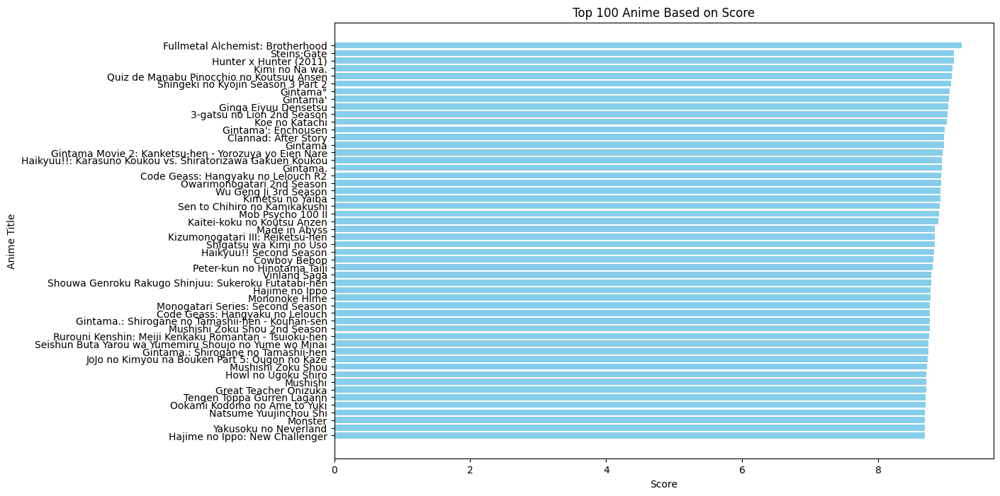

In [19]:
import matplotlib.pyplot as plt

if 'score' in anime_data.columns and 'title' in anime_data.columns:
    top_100_anime = anime_data.sort_values(by='score', ascending=False).head(100)

    plt.figure(figsize=(12, 8))
    plt.barh(top_100_anime['title'], top_100_anime['score'], color='skyblue')
    plt.xlabel('Score')
    plt.ylabel('Anime Title')
    plt.title('Top 100 Anime Based on Score')

    plt.gca().invert_yaxis()

    plt.show()
else:
    print("The required columns 'score' and/or 'title' are missing in the dataset.")
